In [2]:
# Interactive session
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

# Standard library and others
import os
import datetime
import pytz

# Data
import pandas as pd
import numpy as np

# Spark
from pyspark.sql import SparkSession
from pyspark.ml import Pipeline
from pyspark.ml.functions import vector_to_array
from pyspark.ml.stat import Correlation
from pyspark.sql.types import *
import pyspark.pandas as ps
import pyspark.sql.functions as f
from pyspark.ml.feature import PCA, VectorAssembler, StandardScaler

# Plotting
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

datetime.datetime.now(pytz.timezone('US/Eastern')).strftime("%a, %d %B %Y %H:%M:%S")

'Tue, 27 December 2022 02:36:30'

## Global Settings

In [4]:
seed = 1227
rs = np.random.RandomState(seed)

plt.rcParams['figure.figsize'] = (15, 12)

# Standalone session using all cores
spark = SparkSession.builder.master('local[*]') \
                    .appName('credit_card_fraud') \
                    .config('spark.sql.repl.eagerEval.enabled', True) \
                    .config('spark.sql.repl.eagerEval.maxNumRows', 15) \
                    .getOrCreate()
                    
# Pandas on Spark configuration
ps.set_option('display.max_rows', 15)
ps.set_option('plotting.backend', 'plotly')
# If the index does not have to be a sequence that increases one by one, this index should be used
# If the index must be a sequence that increases one by one, 'distributed-sequence' should be used
ps.set_option('compute.default_index_type', 'distributed')

spark

## Data

In [5]:
df = spark.read.csv('../data/raw/creditcard.csv', header=True, inferSchema=True)
df

22/12/27 02:39:28 WARN package: Truncated the string representation of a plan since it was too large. This behavior can be adjusted by setting 'spark.sql.debug.maxToStringFields'.


Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0.0,-1.3598071336738,-0.0727811733098497,2.53634673796914,1.37815522427443,-0.338320769942518,0.462387777762292,0.239598554061257,0.0986979012610507,0.363786969611213,0.0907941719789316,-0.551599533260813,-0.617800855762348,-0.991389847235408,-0.311169353699879,1.46817697209427,-0.470400525259478,0.207971241929242,0.0257905801985591,0.403992960255733,0.251412098239705,-0.018306777944153,0.277837575558899,-0.110473910188767,0.0669280749146731,0.128539358273528,-0.189114843888824,0.133558376740387,-0.0210530534538215,149.62,0
0.0,1.19185711131486,0.26615071205963,0.16648011335321,0.448154078460911,0.0600176492822243,-0.0823608088155687,-0.0788029833323113,0.0851016549148104,-0.255425128109186,-0.166974414004614,1.61272666105479,1.06523531137287,0.48909501589608,-0.143772296441519,0.635558093258208,0.463917041022171,-0.114804663102346,-0.183361270123994,-0.145783041325259,-0.0690831352230203,-0.225775248033138,-0.638671952771851,0.101288021253234,-0.339846475529127,0.167170404418143,0.125894532368176,-0.00898309914322813,0.0147241691924927,2.69,0
1.0,-1.35835406159823,-1.34016307473609,1.77320934263119,0.379779593034328,-0.503198133318193,1.80049938079263,0.791460956450422,0.247675786588991,-1.51465432260583,0.207642865216696,0.624501459424895,0.066083685268831,0.717292731410831,-0.165945922763554,2.34586494901581,-2.89008319444231,1.10996937869599,-0.121359313195888,-2.26185709530414,0.524979725224404,0.247998153469754,0.771679401917229,0.909412262347719,-0.689280956490685,-0.327641833735251,-0.139096571514147,-0.0553527940384261,-0.0597518405929204,378.66,0
1.0,-0.966271711572087,-0.185226008082898,1.79299333957872,-0.863291275036453,-0.0103088796030823,1.24720316752486,0.23760893977178,0.377435874652262,-1.38702406270197,-0.0549519224713749,-0.226487263835401,0.178228225877303,0.507756869957169,-0.28792374549456,-0.631418117709045,-1.0596472454325,-0.684092786345479,1.96577500349538,-1.2326219700892,-0.208037781160366,-0.108300452035545,0.00527359678253453,-0.190320518742841,-1.17557533186321,0.647376034602038,-0.221928844458407,0.0627228487293033,0.0614576285006353,123.5,0
2.0,-1.15823309349523,0.877736754848451,1.548717846511,0.403033933955121,-0.407193377311653,0.0959214624684256,0.592940745385545,-0.270532677192282,0.817739308235294,0.753074431976354,-0.822842877946363,0.53819555014995,1.3458515932154,-1.11966983471731,0.175121130008994,-0.451449182813529,-0.237033239362776,-0.0381947870352842,0.803486924960175,0.408542360392758,-0.00943069713232919,0.79827849458971,-0.137458079619063,0.141266983824769,-0.206009587619756,0.502292224181569,0.219422229513348,0.215153147499206,69.99,0
2.0,-0.425965884412454,0.960523044882985,1.14110934232219,-0.168252079760302,0.42098688077219,-0.0297275516639742,0.476200948720027,0.260314333074874,-0.56867137571251,-0.371407196834471,1.34126198001957,0.359893837038039,-0.358090652573631,-0.137133700217612,0.517616806555742,0.401725895589603,-0.0581328233640131,0.0686531494425432,-0.0331937877876282,0.0849676720682049,-0.208253514656728,-0.559824796253248,-0.0263976679795373,-0.371426583174346,-0.232793816737034,0.105914779097957,0.253844224739337,0.0810802569229443,3.67,0
4.0,1.22965763450793,0.141003507049326,0.0453707735899449,1.20261273673594,0.191880988597645,0.272708122899098,-0.00515900288250983,0.0812129398830894,0.464959994783886,-0.0992543211289237,-1.41690724314928,-0.153825826253651,-0.75106271556262,0.16737196252175,0.0501435942254188,-0.443586797916727,0.00282051247234708,-0.61198733994012,-0.0455750446637976,-0.21963255278686,-0.167716265815783,-0.270709726172363,-0.154103786809305,-0.780055415004671,0.75013693580659,-0.257236845917139,0.0345074297438413,0.00516776890624916,4.99,0
7.0,-0.644269442348146,1.41796354547385,1.0743803763556,-0.492199018495015,0.948934094764157,0.428118462833089,1.12063135838353,-3.80786423873589,0.615374730667027,1.24937617815176,

In [77]:
# Check number of partitions
df.rdd.getNumPartitions()

8

In [6]:
num_rows, num_cols = df.count(), len(df.columns)
num_rows, num_cols

(284807, 31)

In [9]:
df.describe()

summary,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807,284807
mean,94813.85957508067,9.516248586879277...,-4.15138361172585...,-1.31566926771619...,1.497691472230329...,8.941441625255696...,1.397100253946202...,-2.66646562753160...,1.528826849318273...,-2.28944814471669...,2.176532506335261...,1.807448557105258...,-1.28373554762599...,1.804255185096238...,9.899453227961663...,4.972080218043971...,1.458572665119835...,-4.07154931150036...,1.221464793450108...,1.003916325335628...,4.770099438473463...,3.718282533002536...,-4.63038941307884...,2.985802828433598...,4.504351011597839...,7.153153300204557...,1.636403568872130...,-3.56859322007972...,-1.25938608605721...,88.34961925093698,0.001727485630620034
stddev,47488.145954566266,1.9586958038574889,1.6513085794769968,1.5162550051777701,1.4158685749409217,1.3802467340314388,1.332271089757576,1.2370935981826656,1.194352902669203,1.09863208922432,1.0888497654025182,1.0207130277115588,0.9992013895301411,0.9952742301251545,0.9585956112570638,0.9153160116104386,0.87625288738837,0.8493370636743882,0.8381762095288418,0.8140405007685789,0.7709250248871173,0.734524014371313,0.725701560440911,0.6244602955949902,0.6056470678271607,0.5212780705409428,0.48222701326105727,0.4036324949650301,0.3300832641602508,250.12010924018836,0.041527189635464895
min,0.0,-56.407509631329,-72.7157275629303,-48.3255893623954,-5.68317119816995,-113.743306711146,-26.1605059358433,-43.5572415712451,-73.2167184552674,-13.4340663182301,-24.5882624372475,-4.79747346479757,-18.6837146333443,-5.79188120632084,-19.2143254902614,-4.49894467676621,-14.1298545174931,-25.1627993693248,-9.49874592104677,-7.21352743017759,-54.497720494566,-34.8303821448146,-10.933143697655,-44.8077352037913,-2.83662691870341,-10.2953970749851,-2.60455055280817,-22.5656793207827,-15.4300839055349,0.0,0
max,172792.0,2.45492999121121,22.0577289904909,9.38255843282114,16.8753440335975,34.8016658766686,73.3016255459646,120.589493945238,20.0072083651213,15.5949946071278,23.7451361206545,12.0189131816199,7.8483920756446,7.12688295859376,10.5267660517847,8.87774159774277,17.3151115176278,9.25352625047285,5.04106918541184,5.59197142733558,39.4209042482199,27.2028391573154,10.5030900899454,22.5284116897749,4.58454913689817,7.51958867870916,3.5173456116238,31.6121981061363,33.8478078188831,25691.16,1


In [10]:
df.printSchema()

root
 |-- Time: double (nullable = true)
 |-- V1: double (nullable = true)
 |-- V2: double (nullable = true)
 |-- V3: double (nullable = true)
 |-- V4: double (nullable = true)
 |-- V5: double (nullable = true)
 |-- V6: double (nullable = true)
 |-- V7: double (nullable = true)
 |-- V8: double (nullable = true)
 |-- V9: double (nullable = true)
 |-- V10: double (nullable = true)
 |-- V11: double (nullable = true)
 |-- V12: double (nullable = true)
 |-- V13: double (nullable = true)
 |-- V14: double (nullable = true)
 |-- V15: double (nullable = true)
 |-- V16: double (nullable = true)
 |-- V17: double (nullable = true)
 |-- V18: double (nullable = true)
 |-- V19: double (nullable = true)
 |-- V20: double (nullable = true)
 |-- V21: double (nullable = true)
 |-- V22: double (nullable = true)
 |-- V23: double (nullable = true)
 |-- V24: double (nullable = true)
 |-- V25: double (nullable = true)
 |-- V26: double (nullable = true)
 |-- V27: double (nullable = true)
 |-- V28: double (nulla

### Convert Column Names to Lower Case

In [7]:
for col in df.columns:
    df = df.withColumnRenamed(col, col.lower())
df.columns

['time',
 'v1',
 'v2',
 'v3',
 'v4',
 'v5',
 'v6',
 'v7',
 'v8',
 'v9',
 'v10',
 'v11',
 'v12',
 'v13',
 'v14',
 'v15',
 'v16',
 'v17',
 'v18',
 'v19',
 'v20',
 'v21',
 'v22',
 'v23',
 'v24',
 'v25',
 'v26',
 'v27',
 'v28',
 'amount',
 'class']

### Distributions of Columns

In [8]:
psdf = df.to_pandas_on_spark()
psdf

,time,v1,v2,v3,v4,v5,v6,v7,v8,v9,v10,v11,v12,v13,v14,v15,v16,v17,v18,v19,v20,v21,v22,v23,v24,v25,v26,v27,v28,amount,class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0
5,2.0,-0.425966,0.960523,1.141109,-0.168252,0.420987,-0.029728,0.476201,0.260314,-0.568671,-0.371407,1.341262,0.359894,-0.358091,-0.137134,0.517617,0.401726,-0.058133,0.068653,-0.033194,0.084968,-0.208254,-0.559825,-0.026398,-0.371427,-0.232794,0.105915,0.253844,0.081080,3.67,0
6,4.0,1.229658,0.141004,0.045371,1.202613,0.191881,0.272708,-0.005159,0.081213,0.464960,-0.099254,-1.416907,-0.153826,-0.751063,0.167372,0.050144,-0.443587,0.002821,-0.611987,-0.045575,-0.219633,-0.167716,-0.270710,-0.154104,-0.780055,0.750137,-0.257237,0.034507,0.005168,4.99,0
7,7.0,-0.644269,1.417964,1.074380,-0.492199,0.948934,0.428118,1.120631,-3.807864,0.615375,1.249376,-0.619468,0.291474,1.757964,-1.323865,0.686133,-0.076127,-1.222127,-0.358222,0.324505,-0.156742,1.943465,-1.015455,0.057504,-0.649709,-0.415267,-0.051634,-1.206921,-1.085339,40.80,0
8,7.0,-0.894286,0.286157,-0.113192,-0.271526,2.669599,3.721818,0.370145,0.851084,-0.392048,-0.410430,-0.705117,-0.110452,-0.286254,0.074355,-0.328783,-0.210077,-0.499768,0.118765,0.570328,0.052736,-0.073425,-0.268092,-0.204233,1.011592,0.373205,-0.384157,0.011747,0.142404,93.20,0
9,9.0,-0.338262,1.119593,1.044367,-0.222187,0.499361,-0.246761,0.651583,0.069539,-0.736727,-0.366846,1.017614,0.836390,1.006844,-0.443523,0.150219,0.739453,-0.540980,0.476677,0.451773,0.203711,-0.246914,-0.633753,-0.120794,-0.385050,-0.069733,0.094199,0.246219,0.083076,3.68,0


Plot all the columns staring with 'v':

In [105]:
for col in [col for col in psdf.columns if col.startswith('v')]:
    psdf[col].plot.hist(bins=100).update_layout(title=col)

Plot the 'time' and 'amount' columns:

In [104]:
psdf['time'].plot.hist(bins=100).update_layout(title='Time')
# Smaller bins  
psdf['amount'].plot.hist(bins=200).update_layout(title='Amount')

* The distribution of the 'time' column is very multimodal
  
* The distribution of the 'amount' column is very skewed right (Pareto distribution).

### Target Class Imbalance

In [38]:
# Check for nulls
df.select('Class').filter(f.col('Class').isNull()).count()

0

In [39]:
class_imbalance = (df.groupBy('class')
   .agg(f.count('class').alias('raw_count'))
   .withColumn('normalized', (f.col('raw_count') / num_rows) * 100)
   .withColumn('normalized', f.format_number(f.col('normalized'), 10))
   .sort(f.col('raw_count').desc()))
class_imbalance

class,raw_count,normalized
0,284315,99.8272514369
1,492,0.1727485631


The positive class (fraudulent transactions) are severely under-sampled. 

In [15]:
class_imbalance.to_pandas_on_spark().plot.bar(x='class', y='raw_count').update_layout(title='Class', width=700)

### Train, Validation, and Test Split

Add an id column to split the data into training, validation, and test sets:

In [9]:
df = df.withColumn('id', f.monotonically_increasing_id())
df.select(['id'])

id
0
1
2
3
4
5
6
7
8
9


In [10]:
train = df.sampleBy(col='class', fractions={0: 0.8, 1: 0.8}, seed=seed)

In [11]:
test = df.subtract(train)

Now, split the training data into training and validation sets:

In [12]:
validate = train.sampleBy(col='class', fractions={0: 0.2, 1: 0.2}, seed=seed)

In [13]:
train = train.subtract(validate)

Check if class imbalance has been preserved:

In [14]:
(train.select('class')
      .groupBy('class')
      .count()
      .withColumn('normalized', (f.col('count') / train.count()) * 100))

class,count,normalized
1,317,0.17393976306880224
0,181930,99.8260602369312


In [15]:
(validate.select('class')
      .groupBy('class')
      .count()
      .withColumn('normalized', (f.col('count') / validate.count()) * 100))

class,count,normalized
1,74,0.16227714304510865
0,45527,99.8377228569549


In [16]:
(test.select('class')
     .groupBy('class')
     .count()
     .withColumn('normalized', (f.col('count') / test.count()) * 100))

class,count,normalized
1,101,0.17732052880141855
0,56858,99.82267947119858


Ensure that the id's are disjoint between the three sets:

In [26]:
set(train.select('id').toPandas().to_numpy().flatten()).isdisjoint(set(validate.select('id').toPandas().to_numpy().flatten()))

True

In [27]:
set(train.select('id').toPandas().to_numpy().flatten()).isdisjoint(set(test.select('id').toPandas().to_numpy().flatten()))

True

In [28]:
set(validate.select('id').toPandas().to_numpy().flatten()).isdisjoint(set(test.select('id').toPandas().to_numpy().flatten()))

True

Write to disk:

In [33]:
train.drop('id').toPandas().to_parquet('../data/train_val_test/train.parquet', index=False)
validate.drop('id').toPandas().to_parquet('../data/train_val_test/validate.parquet', index=False)
test.drop('id').toPandas().to_parquet('../data/train_val_test/test.parquet', index=False)

## PCA

We do not include the `time` column since it has high variance and it is not clear what it represents.

In [41]:
pca_df = train.select(list(set(df.columns) - set(['time', 'id'])))

In [42]:
pca_cols = list(set(pca_df.columns) - set(['class']))
len(pca_cols)

29

Take the natural log of the `amount` column since it is extremely skewed.

In [43]:
pca_df = pca_df.withColumn('amount', f.log(f.col('amount') + 1e-6)).to_pandas_on_spark()  # Add small constant to avoid log(0)
pca_df.shape

(182247, 30)

In [44]:
pca_df['amount'].plot.hist(bins=50).update_layout(title='Amount')

Quick pipeline:

In [45]:
# Stages
vec_assem = VectorAssembler(inputCols=pca_cols, outputCol='features')
scaler = StandardScaler(inputCol='features', outputCol='scaled_features', withStd=True, withMean=True)
pca = PCA(k=29, inputCol='scaled_features', outputCol='pca_features')

# Pipeline
pipe = Pipeline(stages=[vec_assem, scaler, pca])

In [46]:
model = pipe.fit(pca_df.to_spark())

22/12/27 02:56:03 WARN InstanceBuilder$NativeBLAS: Failed to load implementation from:dev.ludovic.netlib.blas.JNIBLAS
22/12/27 02:56:03 WARN InstanceBuilder$NativeBLAS: Failed to load implementation from:dev.ludovic.netlib.blas.ForeignLinkerBLAS
22/12/27 02:56:05 WARN LAPACK: Failed to load implementation from: com.github.fommil.netlib.NativeSystemLAPACK
22/12/27 02:56:05 WARN LAPACK: Failed to load implementation from: com.github.fommil.netlib.NativeRefLAPACK


### Scree Plot

In [47]:
type(model.stages[-1])

pyspark.ml.feature.PCAModel

In [48]:
scree_plot = pd.DataFrame(
    {'pc': range(1, 30),
     'explained_variance': np.cumsum(model.stages[-1].explainedVariance.toArray())}
)
scree_plot

,pc,explained_variance
0,1,0.051406
1,2,0.088094
2,3,0.124073
3,4,0.159888
4,5,0.195122
5,6,0.230162
6,7,0.265153
7,8,0.300083
8,9,0.334952
9,10,0.369720


In [49]:
px.line(scree_plot, x='pc', y='explained_variance', title='Scree Plot')

* The first three principal components explain only $12.8301\%$ of variance

* We need 23 principal components to explain $80\%$ of variance

See factor loadings (eigenvectors):

In [50]:
loadings = pd.DataFrame({
    'variables': pca_cols
})
loadings[['PC ' + str(i) for i in range(1, 30)]] = model.stages[-1].pc.toArray()
loadings

,variables,PC 1,PC 2,PC 3,PC 4,PC 5,PC 6,PC 7,PC 8,PC 9,...,PC 20,PC 21,PC 22,PC 23,PC 24,PC 25,PC 26,PC 27,PC 28,PC 29
0,v28,-0.020468,0.323893,-0.411058,0.134177,-0.218237,0.124902,0.023185,-0.148218,-0.134548,...,-0.039654,-0.014505,-0.281939,0.070355,0.036299,-0.162996,0.555156,-0.174184,0.255075,-0.017767
1,v1,0.090691,-0.327167,-0.128966,-0.113380,0.000119,-0.032369,-0.018619,-0.003850,-0.387914,...,0.018596,-0.226228,0.243890,0.227335,0.102476,-0.553232,-0.057573,0.082198,0.066531,-0.117204
2,v9,0.094352,0.106065,-0.016555,-0.040915,0.019386,0.096810,-0.161317,-0.281364,-0.101888,...,-0.340956,-0.074100,0.149314,0.037212,0.103402,0.182290,0.041701,0.154034,-0.003243,-0.087931
3,v24,0.014243,-0.033408,0.085647,0.088661,0.051828,0.038380,0.138525,0.088547,0.115652,...,-0.403356,-0.441668,-0.182030,0.060940,-0.157930,0.095456,-0.021057,-0.005338,-0.042564,-0.011643
4,v15,0.050570,0.062336,-0.041935,-0.061931,0.116479,-0.057244,-0.026126,-0.096397,-0.298949,...,-0.252607,0.002418,0.009808,-0.438174,-0.128450,0.065124,-0.060163,-0.010457,-0.066289,-0.038277
5,v19,-0.009029,0.089072,0.027245,-0.013054,-0.173508,-0.031218,0.119248,-0.199313,-0.096154,...,-0.073832,-0.213679,-0.002116,-0.490415,0.063626,-0.227263,-0.099059,-0.091347,-0.021023,0.008662
6,v3,0.036613,-0.019513,0.011944,-0.196351,0.028807,0.324074,0.112175,-0.267387,0.457774,...,0.178521,-0.000846,-0.084678,0.061060,-0.076896,-0.382173,-0.105410,0.158513,0.165154,-0.057524
7,v2,0.500451,-0.428599,-0.271925,0.109760,0.022137,0.086515,0.094905,-0.038685,0.073641,...,-0.032688,0.142636,-0.112458,-0.128491,0.060922,0.117826,-0.056704,-0.033545,-0.115881,-0.516026
8,v10,0.009034,0.155064,-0.059369,-0.234174,0.106773,0.284368,-0.034462,0.058440,-0.316598,...,0.075445,0.360060,0.263249,-0.003777,-0.194781,0.055396,0.056925,0.286658,0.114235,-0.025693
9,v27,0.069287,0.117564,0.312559,-0.371598,-0.509623,0.146613,-0.027699,-0.132544,-0.177682,...,-0.042723,0.033463,-0.240937,0.162396,0.148024,0.028519,-0.134923,0.018025,-0.419520,-0.022078


Plot the first three loadings:

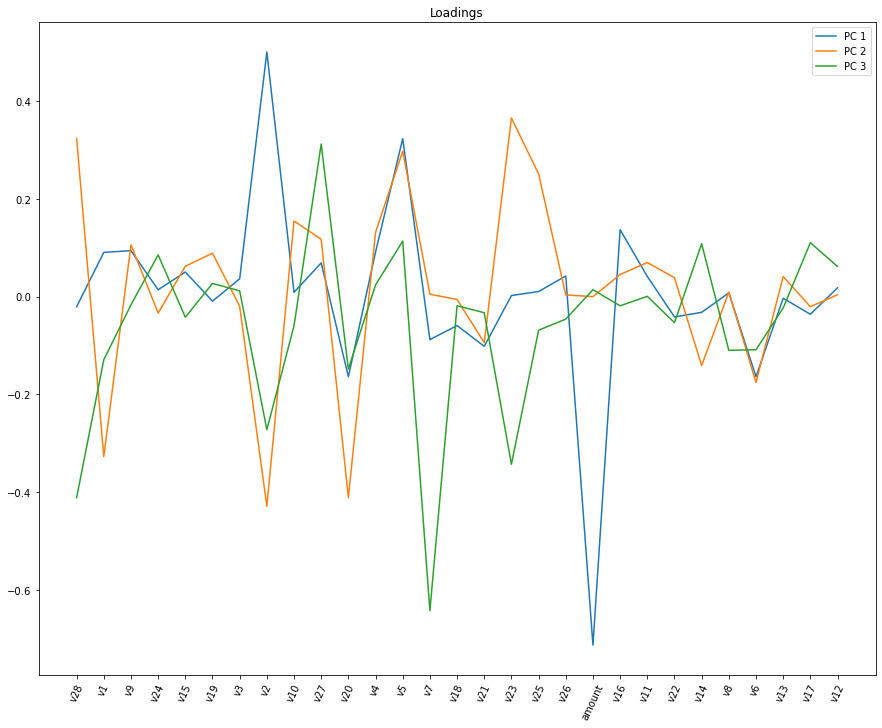

In [52]:
plt.rcParams['figure.figsize'] = (15, 12)
loadings.iloc[:, :4].plot()
plt.xticks(range(0, 29), loadings['variables'], rotation=65)
plt.title('Loadings')
plt.show();

* Columns like `amount`, `v5`, `v2` appear to be important to the first principal component.

* Columns like `v5`, `v25` are correlated with the second principal component.

* Columns like `v27`, `v7` appear to be important to the third principal component.

### Visualize Imbalance Using First Three PC's

In [53]:
# Get pc's
pcs = model.transform(pca_df.to_spark()).select('pca_features')
pcs.printSchema()
pcs

root
 |-- pca_features: vector (nullable = true)



pca_features
[0.57127152387731...
[-0.5226118414987...
[-1.7117478993860...
[1.16673940243375...
[1.21727885003364...
[-0.2682243969419...
[1.15304438934748...
[-0.4333987949453...
[-0.4253331112217...
[0.53522193867325...


In [54]:
# Obtain first three principal components
pcs = (pcs.withColumn('pca_features', vector_to_array('pca_features'))
          .select([f.col('pca_features')[i].alias('pc ' + str(i + 1)) for i in range(3)])
          .toPandas())
# Add target 
pcs['class'] = pca_df['class'].to_numpy()
pcs['class'] = pcs['class'].astype('category')
pcs

,pc 1,pc 2,pc 3,class
0,0.571272,-0.014754,0.415980,0
1,-0.522612,-0.022115,0.064681,0
2,-1.711748,-0.514609,-1.490191,0
3,1.166739,0.124319,-0.007491,0
4,1.217279,-0.389219,-0.302138,0
...,...,...,...,...
182242,-0.794776,-1.025853,-0.123710,0
182243,-0.351342,0.052298,0.057988,0
182244,-0.188725,0.032132,0.199977,0
182245,-0.405708,0.149690,-0.158013,0


In [55]:
fig = px.scatter_3d(pcs, x='pc 1', y='pc 2', z='pc 3', color='class', width=1000, height=500)
fig.write_html('../outputs/plots/first_three_pc.html') # Write interactive 3d plot to html file
fig.show()

## Correlation Matrix

In [56]:
corr_mat = Correlation.corr(
    dataset=VectorAssembler(inputCols=pca_cols + ['class'], outputCol='columns').transform(train).select('columns'),
    column='columns',
    method='pearson'
).collect()[0][0].toArray()
corr_mat.shape

/Users/kenwu/opt/anaconda3/envs/python_for_machine_learning/lib/python3.9/site-packages/pyspark/sql/context.py:125: FutureWarning:

Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.



(30, 30)

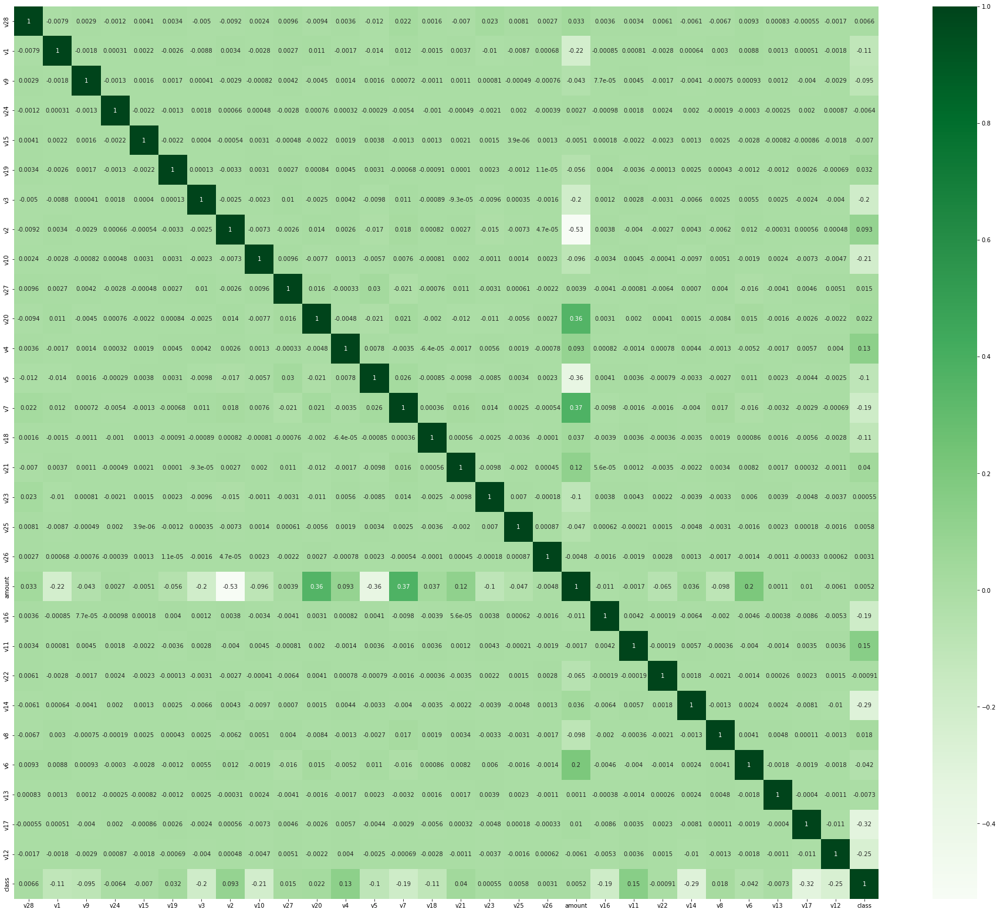

In [57]:
plt.figure(figsize=(33, 28))
corr_heatmap = sns.heatmap(
    corr_mat, 
    xticklabels=pca_cols + ['class'],
    yticklabels=pca_cols + ['class'],  
    cmap='Greens', 
    annot=True
)
corr_heatmap.get_figure().savefig('../outputs/plots/corr_heatmap.pdf')
plt.show();

The `amount` columns is correlated with many of the unnamed variables.